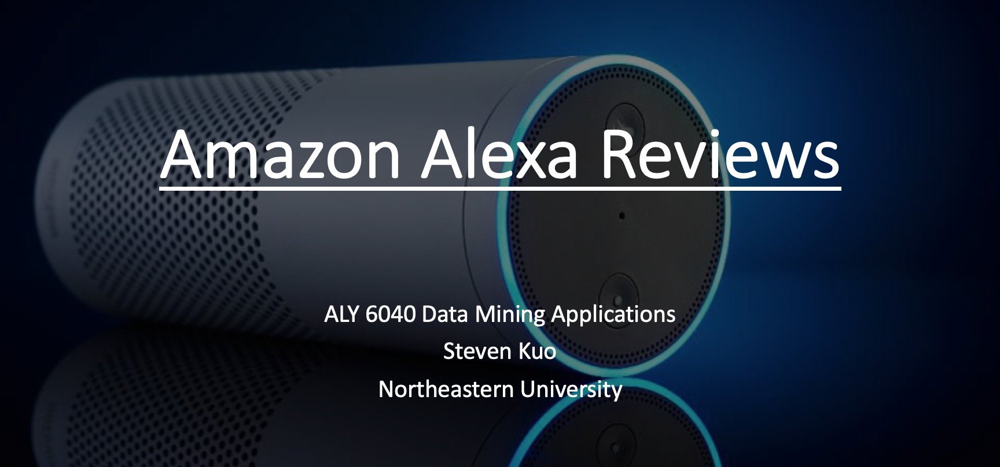

In [1]:
from PIL import Image
Image.open('Final Cover.png')

<font color=yellow ><font>
## Imports usefull packages

In [2]:
import keras
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix, roc_auc_score
from sklearn import svm
import xgboost as xgb
import seaborn as sns
import nltk
import gensim
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.tokenize import word_tokenize
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.patches as mpatches
import re
import codecs
import matplotlib.pyplot as plt
import json
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from os import path, getcwd
%matplotlib inline
# Ignore  the warnings
import warnings
warnings.filterwarnings("always")
warnings.filterwarnings("ignore")

Using TensorFlow backend.
/Users/StevenKuo/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/StevenKuo/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/StevenKuo/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/Users/StevenKuo/anaconda3/lib/python3.7/sit

 <font color=yellow ><font>
 ## Load Data into Pandas

In [3]:
# Import data and transform tsv file
df_ori = pd.read_csv("amazon_alexa.tsv", delimiter = "\t")
df_ori.shape

(3150, 5)

In [4]:
# Overview
df_ori.rename({"variation": "products"}, axis = 1, inplace = True)
df_ori.head()

,rating,date,products,verified_reviews,feedback
0,5,31-Jul-18,Charcoal Fabric,Love my Echo!,1
1,5,31-Jul-18,Charcoal Fabric,Loved it!,1
2,4,31-Jul-18,Walnut Finish,"Sometimes while playing a game, you can answer...",1
3,5,31-Jul-18,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,1
4,5,31-Jul-18,Charcoal Fabric,Music,1


In [5]:
# Delete the column "date"
del df_ori["date"]
df_ori.head()

,rating,products,verified_reviews,feedback
0,5,Charcoal Fabric,Love my Echo!,1
1,5,Charcoal Fabric,Loved it!,1
2,4,Walnut Finish,"Sometimes while playing a game, you can answer...",1
3,5,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,1
4,5,Charcoal Fabric,Music,1


<font color=yellow ><font>
## Part 1_Exploratory Data Analysis (EDA)

In [6]:
# Missing values
df_ori.isnull().sum()

rating              0
products            0
verified_reviews    0
feedback            0
dtype: int64

In [7]:
# Data types
df_ori.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3150 entries, 0 to 3149
Data columns (total 4 columns):
rating              3150 non-null int64
products            3150 non-null object
verified_reviews    3150 non-null object
feedback            3150 non-null int64
dtypes: int64(2), object(2)
memory usage: 98.6+ KB


In [8]:
# Basic Statistics 
df_ori.describe()

,rating,feedback
count,3150.000000,3150.000000
mean,4.463175,0.918413
std,1.068506,0.273778
min,1.000000,0.000000
25%,4.000000,1.000000
50%,5.000000,1.000000
75%,5.000000,1.000000
max,5.000000,1.000000


In [9]:
# Group by products
df_products_count = df_ori.groupby("products").products.count().sort_values(ascending = False)
df_products_count

products
Black  Dot                      516
Charcoal Fabric                 430
Configuration: Fire TV Stick    350
Black  Plus                     270
Black  Show                     265
Black                           261
Black  Spot                     241
White  Dot                      184
Heather Gray Fabric             157
White  Spot                     109
White                            91
Sandstone Fabric                 90
White  Show                      85
White  Plus                      78
Oak Finish                       14
Walnut Finish                     9
Name: products, dtype: int64

Text(0, 0.5, 'Products')

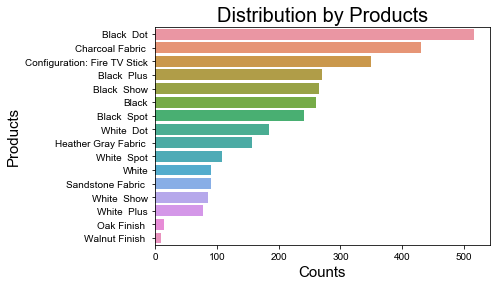

In [10]:
# Bar chart of products
products = sns.barplot(x = df_products_count, y = df_products_count.index)
sns.set_style("whitegrid")
sns.set_context("notebook")
products.axes.set_title("Distribution by Products", fontsize = 20)
products.set_xlabel("Counts", fontsize = 15)
products.set_ylabel("Products", fontsize = 15)

In [11]:
# Group by rating
df_rating_count = df_ori.groupby("rating").rating.count()
df_rating_count

rating
1     161
2      96
3     152
4     455
5    2286
Name: rating, dtype: int64

Text(0, 0.5, 'Counts')

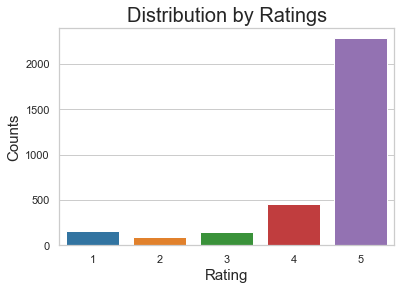

In [12]:
# Bar chart of rating
rating = sns.barplot(x = df_rating_count.index, y = df_rating_count)
sns.set_style("whitegrid")
sns.set_context("notebook")
rating.axes.set_title("Distribution by Ratings", fontsize = 20)
rating.set_xlabel("Rating", fontsize = 15)
rating.set_ylabel("Counts", fontsize = 15)

Text(0.5, 1.0, 'The Ratio of Positive Rating and Negative Rating')

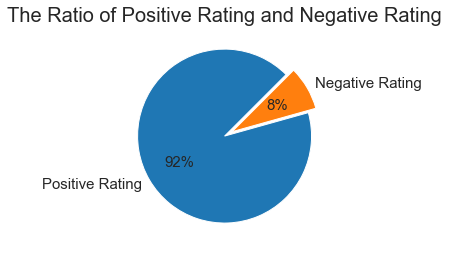

In [13]:
# Pie chart of positive rating and negative rating
rating_pos = df_rating_count.iloc[2] + df_rating_count.iloc[3] + df_rating_count.iloc[4]
rating_neg = df_rating_count.iloc[0] + df_rating_count.iloc[1]
rating_ratio = [rating_pos / (rating_pos + rating_neg), rating_neg / (rating_pos + rating_neg)]
plt.pie(rating_ratio, explode = [0, 0.1], labels = ["Positive Rating", "Negative Rating"],
        autopct = '%0.0f%%', textprops = {"fontsize": 15}, shadow = False, startangle = 45)
plt.title("The Ratio of Positive Rating and Negative Rating", fontsize = 20)

<font color=yellow ><font>
## Part 2-1_Text Preprocessing

In [14]:
# Re-write the column "feedack" with useful information:
# 0 = Positive feedback (rating: 3, 4, and 5) and 1 = Negative feedback (rating: 1 and 2)
for x in df_ori.rating.index:
    if df_ori.rating[x] > 2:
        df_ori["feedback"][x] = 0
    else:
        df_ori["feedback"][x] = 1
df_ori.head()

,rating,products,verified_reviews,feedback
0,5,Charcoal Fabric,Love my Echo!,0
1,5,Charcoal Fabric,Loved it!,0
2,4,Walnut Finish,"Sometimes while playing a game, you can answer...",0
3,5,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,0
4,5,Charcoal Fabric,Music,0


In [15]:
# Get length of review
df_ori["review_length"] = df_ori.verified_reviews.apply(lambda x: len(x))
df_ori.head()

,rating,products,verified_reviews,feedback,review_length
0,5,Charcoal Fabric,Love my Echo!,0,13
1,5,Charcoal Fabric,Loved it!,0,9
2,4,Walnut Finish,"Sometimes while playing a game, you can answer...",0,195
3,5,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,0,172
4,5,Charcoal Fabric,Music,0,5


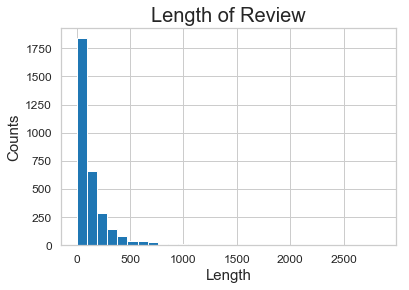

In [16]:
# Distribution of review length
fig = plt.figure()
ax = fig.add_subplot(111)
df_ori["review_length"].hist(bins = 30)
plt.title("Length of Review", fontsize = 20)
plt.xlabel("Length", fontsize = 15)
plt.ylabel("Counts", fontsize = 15)
ax.tick_params(axis = "x", labelsize = 12)
ax.tick_params(axis = "y", labelsize = 12)

In [17]:
# Get the length of the longest review
length_max = df_ori["review_length"].max()
length_max_index = df_ori.index[df_ori["review_length"] == length_max].tolist()
print("The maximum review length is", length_max)
print("The index of the maximum review length is", length_max_index)

The maximum review length is 2851
The index of the maximum review length is [2016]


In [18]:
# Take a look at the longest review
df_ori.verified_reviews.values[2016]

"Incredible piece of technology.I have this right center of my living room on an island kitchen counter. The mic and speaker goes in every direction and the quality of the sound is quite good. I connected the Echo via Bluetooth to my Sony soundbar on my TV but find the Echo placement and 360 sound more appealing. It's no audiophile equipment but there is good range and decent bass. The sound is more than adequate for any indoor entertaining and loud enough to bother neighbors in my building. The knob on the top works great for adjusting volume. This is my first Echo device and I would imagine having to press volume buttons (on the Echo 2) a large inconvenience and not as precise. For that alone I would recommend this over the regular Echo (2nd generation).The piece looks quality and is quite sturdy with some weight on it. The rubber material on the bottom has a good grip on the granite counter-- my cat can even rub her scent on it without tipping it over.This order came with a free Phi

In [19]:
# Apply RegEx
df_ori["clean_review"] = df_ori["verified_reviews"].str.replace(r"[^a-zA-Z]", " ")
df_ori["clean_review"] = df_ori["verified_reviews"].str.replace(" +", " ")
df_ori["clean_review"] = df_ori["verified_reviews"].str.replace("--", " ")
df_ori["clean_review"] = df_ori["verified_reviews"].str.replace("&#", " ")
df_ori["clean_review"] = df_ori["clean_review"].str.lower()
df_clean = df_ori
df_clean.head()

,rating,products,verified_reviews,feedback,review_length,clean_review
0,5,Charcoal Fabric,Love my Echo!,0,13,love my echo!
1,5,Charcoal Fabric,Loved it!,0,9,loved it!
2,4,Walnut Finish,"Sometimes while playing a game, you can answer...",0,195,"sometimes while playing a game, you can answer..."
3,5,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,0,172,i have had a lot of fun with this thing. my 4 ...
4,5,Charcoal Fabric,Music,0,5,music


In [20]:
# Check the longest review again
df_clean["clean_review"][2016]

"incredible piece of technology.i have this right center of my living room on an island kitchen counter. the mic and speaker goes in every direction and the quality of the sound is quite good. i connected the echo via bluetooth to my sony soundbar on my tv but find the echo placement and 360 sound more appealing. it's no audiophile equipment but there is good range and decent bass. the sound is more than adequate for any indoor entertaining and loud enough to bother neighbors in my building. the knob on the top works great for adjusting volume. this is my first echo device and i would imagine having to press volume buttons (on the echo 2) a large inconvenience and not as precise. for that alone i would recommend this over the regular echo (2nd generation).the piece looks quality and is quite sturdy with some weight on it. the rubber material on the bottom has a good grip on the granite counter-- my cat can even rub her scent on it without tipping it over.this order came with a free phi

Text(0, 0.5, 'Length of Review')

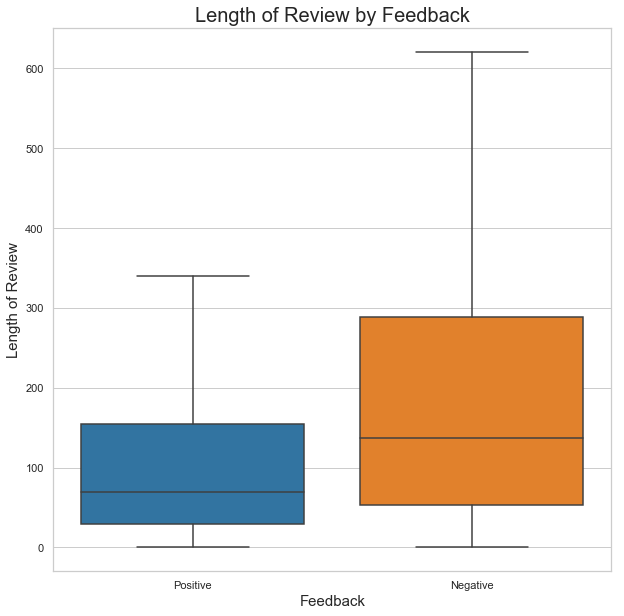

In [21]:
# Boxplot without outliers
plt.figure(figsize = (10, 10))
box_p_n = sns.boxplot(df_ori["feedback"], df_clean["review_length"],
                      order=[0, 1], showfliers = False)
plt.xticks([0, 1], ["Positive", "Negative"])
box_p_n.axes.set_title("Length of Review by Feedback", fontsize = 20)
box_p_n.set_xlabel("Feedback", fontsize = 15)
box_p_n.set_ylabel("Length of Review", fontsize = 15)

In [22]:
# Tokenization
df_clean["tokens"] = df_clean["clean_review"].apply(nltk.word_tokenize)
df_clean.head()

,rating,products,verified_reviews,feedback,review_length,clean_review,tokens
0,5,Charcoal Fabric,Love my Echo!,0,13,love my echo!,"[love, my, echo, !]"
1,5,Charcoal Fabric,Loved it!,0,9,loved it!,"[loved, it, !]"
2,4,Walnut Finish,"Sometimes while playing a game, you can answer...",0,195,"sometimes while playing a game, you can answer...","[sometimes, while, playing, a, game, ,, you, c..."
3,5,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,0,172,i have had a lot of fun with this thing. my 4 ...,"[i, have, had, a, lot, of, fun, with, this, th..."
4,5,Charcoal Fabric,Music,0,5,music,[music]


In [23]:
# Extra Inspection
all_words = [word for tokens in df_clean["tokens"] for word in tokens]
sentence_len = [len(tokens) for tokens in df_clean["tokens"]]
vocab = sorted(list(set(all_words)))
print("%s words total, with a vocabulary size of %s" % (len(all_words), len(vocab)))
print("Max sentence length is %s" % max(sentence_len))

91644 words total, with a vocabulary size of 4447
Max sentence length is 616


<font color=yellow ><font>
## Part 2-2_WordCloud

In [24]:
# The list of stopwords
stopwords = set(STOPWORDS)
additional_stops = ["amazon","alexa", "device", "devices", "product", "products", "work",
                    "works", "doesn", "still", "will", "thing", "really", "one", "item",
                    "working", "time", "things", "thing", "want", "need", "use", "try", "even",
                    "got", "back", "bought", "buy"]
stopwords.update( list(STOPWORDS) + additional_stops)

(-0.5, 1175.5, 1175.5, -0.5)

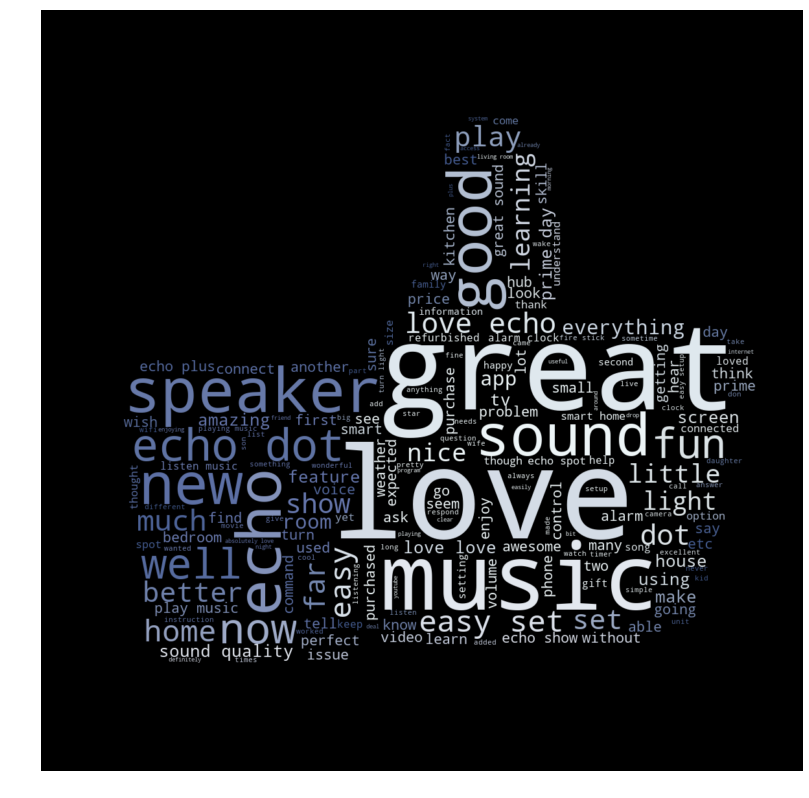

In [25]:
d = getcwd()
# Join positive reviews
df_positive = df_clean[df_clean.feedback == 0]
text_pos = " ".join(df_positive["clean_review"])
# Load image
mask_pos = np.array(Image.open(path.join(d, "up.png")))
#wc = WordCloud(mask=mask, background_color="white", max_words=1000, 
#               max_font_size=90, random_state=42)
wc = WordCloud(mask = mask_pos, stopwords = stopwords, background_color = "black")
wc.generate(text_pos)
# Create coloring from image
image_colors = ImageColorGenerator(mask_pos)
plt.figure(figsize = [14,14])
plt.imshow(wc.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis("off")

(-0.5, 1175.5, 1175.5, -0.5)

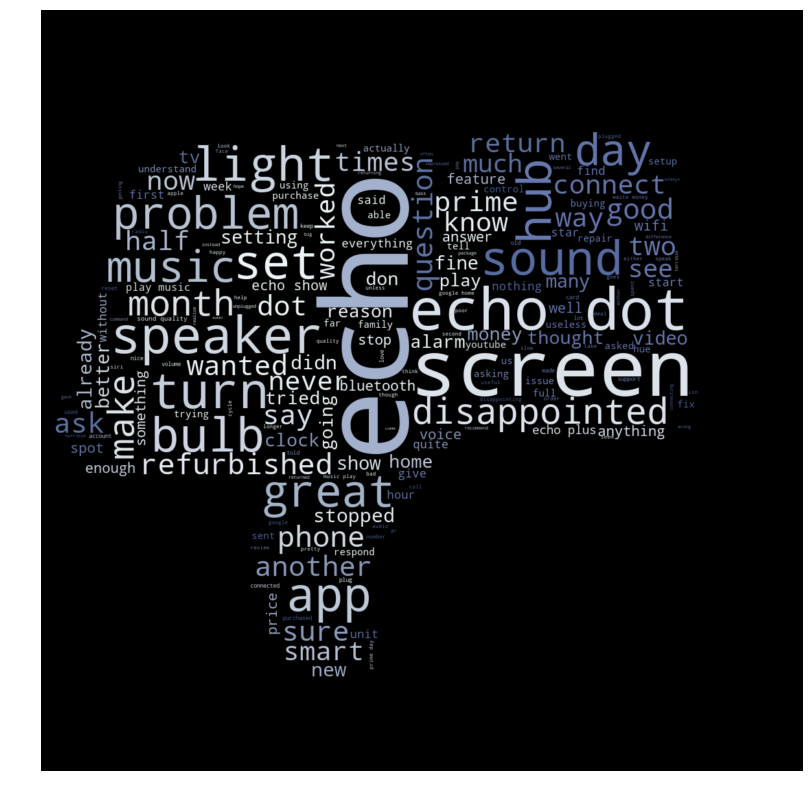

In [26]:
d = getcwd()
# Join positive reviews
df_negative = df_clean[df_clean.feedback == 1]
text_neg = " ".join(df_negative["clean_review"])
# Load image
mask_neg = np.array(Image.open(path.join(d, "down.png")))
#wc = WordCloud(mask=mask_neg, background_color="white", max_words=1000, 
#               max_font_size=90, random_state=42)
wc = WordCloud(mask = mask_neg, stopwords = stopwords, background_color = "black")
wc.generate(text_neg)
# Create coloring from image
image_colors = ImageColorGenerator(mask_neg)
plt.figure(figsize = [14,14])
plt.imshow(wc.recolor(color_func = image_colors), interpolation = "bilinear")
plt.axis("off")

<font color=yellow ><font>
## Machine Learning Section

<font color=yellow ><font>
## Part 3_Split the Data into 80% Traning and 20% Test Datasets

In [27]:
x = df_clean["clean_review"].tolist()
y = df_clean["feedback"].tolist()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 111)

<font color=yellow ><font>
## Part 4-1_Bag of Words + Logistic Regression

In [28]:
# Bag of Words
def cv(data):
    bow_vectorizer = CountVectorizer()
    emb = bow_vectorizer.fit_transform(data)
    return emb, bow_vectorizer

x_train_bow, bow_vectorizer = cv(x_train)
x_test_bow = bow_vectorizer.transform(x_test)

# Count hte frequency of two classes
pos_ct = y_train.count(0)
neg_ct = y_train.count(1)
print("0:", pos_ct, "1:", neg_ct)

0: 2312 1: 208


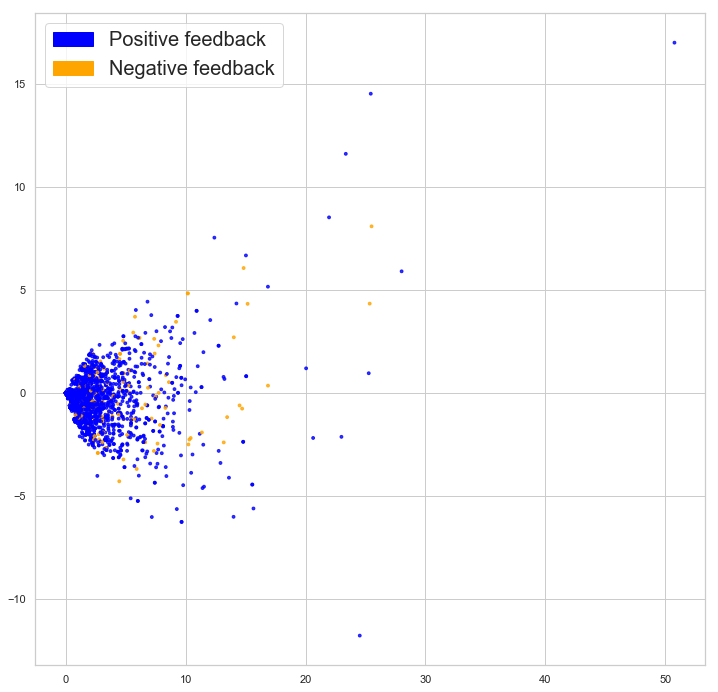

In [29]:
def plot_LSA(test_data, test_labels, savepath = "PCA_demo.csv", plot = True):
        lsa = TruncatedSVD(n_components = 2)
        lsa.fit(test_data)
        lsa_scores = lsa.transform(test_data)
        color_mapper = {label:idx for idx,label in enumerate(set(test_labels))}
        color_column = [color_mapper[label] for label in test_labels]
        colors = ["blue","orange","orange"]
        if plot:
            plt.scatter(lsa_scores[:,0], lsa_scores[:,1], s=8, alpha=.8, c=test_labels,
                        cmap = matplotlib.colors.ListedColormap(colors))
            red_patch = mpatches.Patch(color = "blue", label = "Positive feedback")
            green_patch = mpatches.Patch(color = "orange", label = "Negative feedback")
            plt.legend(handles = [red_patch, green_patch], prop = {'size': 20})

fig = plt.figure(figsize = (12, 12))          
plot_LSA(x_train_bow, y_train)

In [30]:
# SMOTE (Synthetic Minority Oversampling Technique)
sm = SMOTE(random_state = 11, ratio = 1)
x_train_bow_res, y_train_res = sm.fit_sample(x_train_bow, y_train)

# Count the frequency of two classes
unique_elements, counts_elements = np.unique(y_train_res, return_counts=True)
print("0:", counts_elements[0], "1:", counts_elements[1])

0: 2312 1: 2312


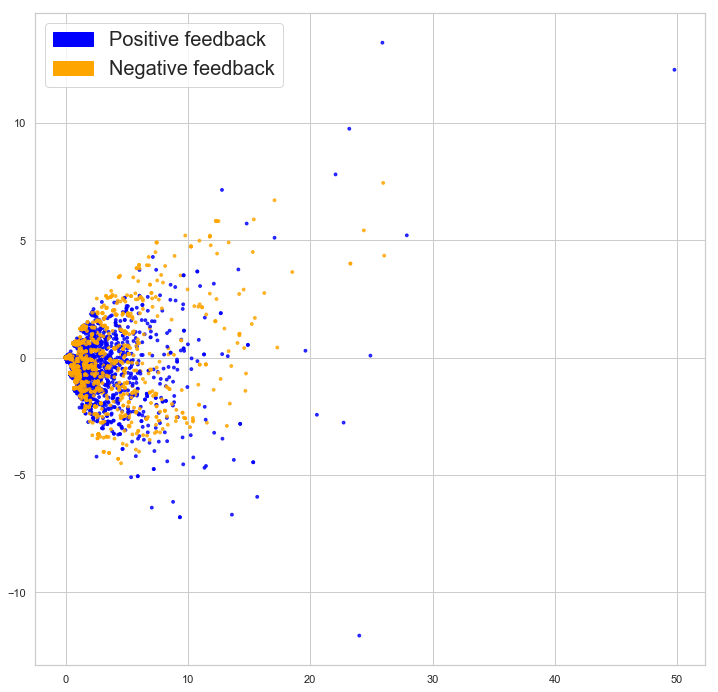

In [31]:
fig = plt.figure(figsize = (12, 12))          
plot_LSA(x_train_bow_res, y_train_res)

Text(0.5, 1.0, 'The Ratio of Positive Rating and Negative Rating')

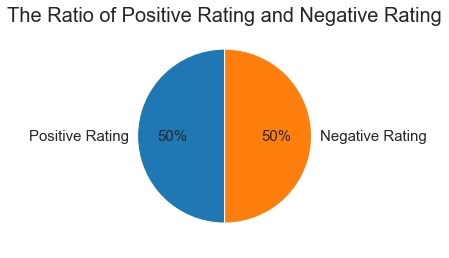

In [32]:
# Pie chart of positive rating and negative rating with the balanced dataset
rating_pos = counts_elements[0]
rating_neg = counts_elements[1]
rating_ratio = [rating_pos / (rating_pos + rating_neg), rating_neg / (rating_pos + rating_neg)]
plt.pie(rating_ratio, explode = [0, 0], labels = ["Positive Rating", "Negative Rating"],
        autopct = '%0.0f%%', textprops = {"fontsize": 15}, shadow = False, startangle = 90)
plt.title("The Ratio of Positive Rating and Negative Rating", fontsize = 20)

accuracy = 0.908, precision = 0.446, recall = 0.755, f1 = 0.561
AUC = 0.86


[Text(0, 0.5, 'Positive'), Text(0, 1.5, 'Negative')]

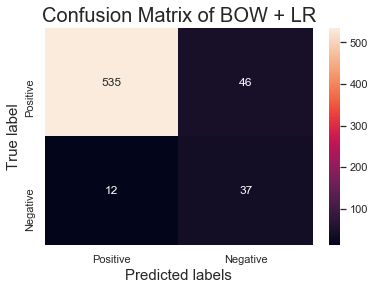

In [33]:
# Fitting a Classifier
clf_bow = LogisticRegression(C = 2.0, class_weight = "balanced", solver = "liblinear",
                             n_jobs = -1, random_state = 111)
clf_bow.fit(x_train_bow_res, y_train_res)
y_predicted_bow = clf_bow.predict(x_test_bow)

# Evaluation
def get_metrics(y_test, y_predicted):  
    cm = confusion_matrix(y_test,y_predicted)
    # (true positives + true negatives) / total
    accuracy = accuracy_score(y_test, y_predicted)
    # true positives / (true positives + false positives)
    precision = precision_score(y_test, y_predicted)
    # true positives / (true positives + false negatives)
    recall = recall_score(y_test, y_predicted)
    # (2 * precision * recall) / (precision + recall)
    f1 = f1_score(y_test, y_predicted)
    return accuracy, precision, recall, f1
# , pos_label = None, average = "weighted"
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_bow)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" %
      (accuracy, precision, recall, f1))

# AUC Score
y_pred_proba_bow = clf_bow.predict_proba(x_test_bow)[::,1]
auc = roc_auc_score(y_test, y_pred_proba_bow)
print("AUC = %.2f" % auc)

# Plot Confusion Matrix
cm_bow = sns.heatmap(metrics.confusion_matrix(y_test, y_predicted_bow),
                     annot = True, fmt = "2.0f")

cm_bow.axes.set_title("Confusion Matrix of BOW + LR", fontsize = 20)
cm_bow.set_xlabel("Predicted labels", fontsize = 15)
cm_bow.set_ylabel("True label", fontsize = 15)
cm_bow.xaxis.set_ticklabels(["Positive", "Negative"])
cm_bow.yaxis.set_ticklabels(["Positive", "Negative"])

<font color=yellow ><font>
## Part 4-2_Bag of Words + TF-IDF + Logistic Regression

accuracy = 0.922, precision = 0.500, recall = 0.776, f1 = 0.608
AUC = 0.93


[Text(0, 0.5, 'Positive'), Text(0, 1.5, 'Negative')]

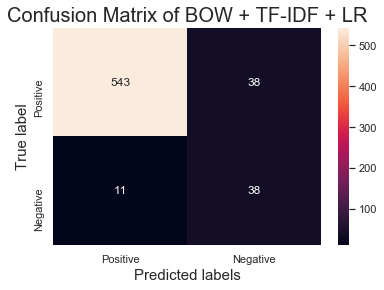

In [34]:
# TF-IDF
def tfidf(data):
    tfidf_vectorizer = TfidfVectorizer()
    train = tfidf_vectorizer.fit_transform(data)
    return train, tfidf_vectorizer

x_train_tfidf, tfidf_vectorizer = tfidf(x_train)
x_test_tfidf = tfidf_vectorizer.transform(x_test)

# SMOTE (Synthetic Minority Oversampling Technique)
sm = SMOTE(random_state = 11, ratio = 1)
x_train_tfidf_res, y_train_res = sm.fit_sample(x_train_tfidf, y_train)

# Fitting a LR Classifier
clf_tfidf = LogisticRegression(C = 25.0, class_weight = "balanced", solver = "liblinear",
                               n_jobs = -1, random_state = 111)
clf_tfidf.fit(x_train_tfidf_res, y_train_res)
y_predicted_tfidf = clf_tfidf.predict(x_test_tfidf)

# Evaluation
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_tfidf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" %
      (accuracy, precision, recall, f1))

# AUC Score
y_pred_proba_tfidf = clf_tfidf.predict_proba(x_test_tfidf)[::,1]
auc = roc_auc_score(y_test, y_pred_proba_tfidf)
print("AUC = %.2f" % auc)

# Plot Confusion Matrix
cm_tfidf = sns.heatmap(metrics.confusion_matrix(y_test, y_predicted_tfidf),
                       annot = True, fmt = "2.0f")

cm_tfidf.axes.set_title("Confusion Matrix of BOW + TF-IDF + LR", fontsize = 20)
cm_tfidf.set_xlabel("Predicted labels", fontsize = 15)
cm_tfidf.set_ylabel("True label", fontsize = 15)
cm_tfidf.xaxis.set_ticklabels(["Positive", "Negative"])
cm_tfidf.yaxis.set_ticklabels(["Positive", "Negative"])

<font color=yellow ><font>
## Part 4-3_Bag of Words + SVM

accuracy = 0.910, precision = 0.447, recall = 0.694, f1 = 0.544
AUC = 0.83


[Text(0, 0.5, 'Positive'), Text(0, 1.5, 'Negative')]

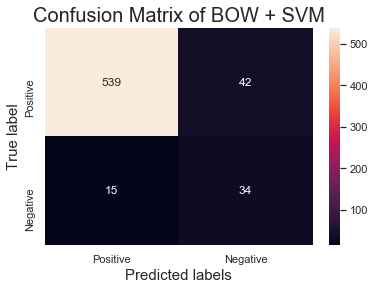

In [35]:
# Fitting a SVM Classifier
clf_svm = svm.SVC(kernel = "linear", C = 1.0, class_weight = "balanced",
                  probability=True, random_state = 111)
clf_svm.fit(x_train_bow_res, y_train_res)
y_predicted_svm = clf_svm.predict(x_test_bow)

# Evaluation
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_svm)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" %
      (accuracy, precision, recall, f1))

# AUC Score
y_pred_proba_svm = clf_svm.predict_proba(x_test_bow)[::,1]
auc = roc_auc_score(y_test, y_pred_proba_svm)
print("AUC = %.2f" % auc)

# Plot Confusion Matrix
cm_svm = sns.heatmap(metrics.confusion_matrix(y_test, y_predicted_svm),
                     annot = True, fmt = "2.0f")

cm_svm.axes.set_title("Confusion Matrix of BOW + SVM", fontsize = 20)
cm_svm.set_xlabel("Predicted labels", fontsize = 15)
cm_svm.set_ylabel("True label", fontsize = 15)
cm_svm.xaxis.set_ticklabels(["Positive", "Negative"])
cm_svm.yaxis.set_ticklabels(["Positive", "Negative"])

<font color=yellow ><font>
## Part 4-4_Bag of Words + TF-IDF + SVM

accuracy = 0.906, precision = 0.440, recall = 0.755, f1 = 0.556
AUC = 0.91


[Text(0, 0.5, 'Positive'), Text(0, 1.5, 'Negative')]

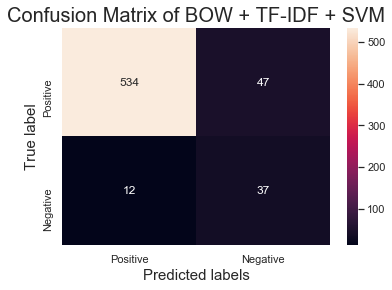

In [36]:
# Fitting a SVM Classifier
clf_tfidf_svm = svm.SVC(kernel = "linear", C = 1.0, class_weight = "balanced",
                        probability=True, random_state = 111)
clf_tfidf_svm.fit(x_train_tfidf_res, y_train_res)
y_predicted_tfidf_svm = clf_tfidf_svm.predict(x_test_tfidf)

# Evaluation
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_tfidf_svm)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" %
      (accuracy, precision, recall, f1))

# AUC Score
y_pred_proba_tfidf_svm = clf_tfidf_svm.predict_proba(x_test_tfidf)[::,1]
auc = roc_auc_score(y_test, y_pred_proba_tfidf_svm)
print("AUC = %.2f" % auc)

# Plot Confusion Matrix
cm_tfidf_svm = sns.heatmap(metrics.confusion_matrix(y_test, y_predicted_tfidf_svm),
                           annot = True, fmt = "2.0f")

cm_tfidf_svm.axes.set_title("Confusion Matrix of BOW + TF-IDF + SVM", fontsize = 20)
cm_tfidf_svm.set_xlabel("Predicted labels", fontsize = 15)
cm_tfidf_svm.set_ylabel("True label", fontsize = 15)
cm_tfidf_svm.xaxis.set_ticklabels(["Positive", "Negative"])
cm_tfidf_svm.yaxis.set_ticklabels(["Positive", "Negative"])

<font color=yellow ><font>
## Part 4-5_Bag of Words + XGBoost

accuracy = 0.937, precision = 0.714, recall = 0.306, f1 = 0.429
AUC = 0.84


[Text(0, 0.5, 'Positive'), Text(0, 1.5, 'Negative')]

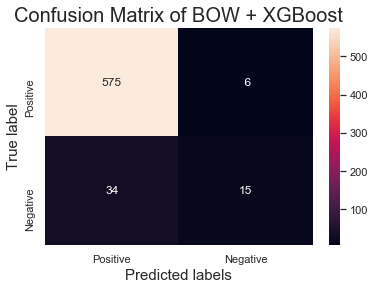

In [57]:
# Fitting a XGBoost Classifier
clf_xgb = xgb.XGBClassifier(n_jobs = -1, class_weight = "balanced", random_state = 111)
clf_xgb.fit(x_train_bow_res, y_train_res)
y_predicted_xgb = clf_xgb.predict(x_test_bow)

# Evaluation
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_xgb)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" %
      (accuracy, precision, recall, f1))

# AUC Score
y_pred_proba_xgb = clf_xgb.predict_proba(x_test_bow)[::,1]
auc = roc_auc_score(y_test, y_pred_proba_xgb)
print("AUC = %.2f" % auc)

# Plot Confusion Matrix
cm_xgb = sns.heatmap(metrics.confusion_matrix(y_test, y_predicted_xgb),
                     annot = True, fmt = "2.0f")

cm_xgb.axes.set_title("Confusion Matrix of BOW + XGBoost", fontsize = 20)
cm_xgb.set_xlabel("Predicted labels", fontsize = 15)
cm_xgb.set_ylabel("True label", fontsize = 15)
cm_xgb.xaxis.set_ticklabels(["Positive", "Negative"])
cm_xgb.yaxis.set_ticklabels(["Positive", "Negative"])

<font color=yellow ><font>
## Part 4-6_Bag of Words + TF-IDF + XGBoost

accuracy = 0.867, precision = 0.327, recall = 0.673, f1 = 0.440
AUC = 0.90


[Text(0, 0.5, 'Positive'), Text(0, 1.5, 'Negative')]

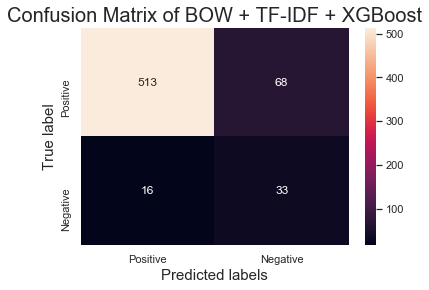

In [38]:
# Fitting a XGBoost Classifier
clf_tfidf_xgb = xgb.XGBClassifier(n_jobs = -1, class_weight = "balanced", random_state = 111)
clf_tfidf_xgb.fit(x_train_tfidf_res, y_train_res)
y_predicted_tfidf_xgb = clf_tfidf_xgb.predict(x_test_tfidf)

# Evaluation
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_tfidf_xgb)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" %
      (accuracy, precision, recall, f1))

# AUC Score
y_pred_proba_tfidf_xgb = clf_tfidf_xgb.predict_proba(x_test_tfidf)[::,1]
auc = roc_auc_score(y_test, y_pred_proba_tfidf_xgb)
print("AUC = %.2f" % auc)

# Plot Confusion Matrix
cm_tfidf_xgb = sns.heatmap(metrics.confusion_matrix(y_test, y_predicted_tfidf_xgb),
                     annot = True, fmt = "2.0f")

cm_tfidf_xgb.axes.set_title("Confusion Matrix of BOW + TF-IDF + XGBoost", fontsize = 20)
cm_tfidf_xgb.set_xlabel("Predicted labels", fontsize = 15)
cm_tfidf_xgb.set_ylabel("True label", fontsize = 15)
cm_tfidf_xgb.xaxis.set_ticklabels(["Positive", "Negative"])
cm_tfidf_xgb.yaxis.set_ticklabels(["Positive", "Negative"])

<font color=yellow ><font>
## Part 5_Word2Vec + Logistic Regression

In [39]:
# Pre-trained model
word2vec_path = "GoogleNews-vectors-negative300.bin"
word2vec = gensim.models.KeyedVectors.load_word2vec_format(word2vec_path,
                                                           binary = True)

def get_average_word2vec(tokens_list, vector, generate_missing = False, k = 300):
    if len(tokens_list) < 1:
        return np.zeros(k)
    if generate_missing:
        vectorized = [vector[word]
                      if word in vector
                      else np.random.rand(k) for word in tokens_list]
    else:
        vectorized = [vector[word]
                      if word in vector
                      else np.zeros(k) for word in tokens_list]
    length = len(vectorized)
    summed = np.sum(vectorized, axis = 0)
    averaged = np.divide(summed, length)
    return averaged

def get_word2vec_embeddings(vectors, clean_questions, generate_missing = False):
    embeddings = clean_questions["tokens"].apply(
        lambda x:get_average_word2vec(x, vectors, generate_missing = generate_missing))
    return list(embeddings)

emb = get_word2vec_embeddings(word2vec, df_clean)
x_train_w2v, x_test_w2v, y_train_w2v, y_test_w2v = train_test_split(emb, y,
                                                                    test_size = 0.2,
                                                                    random_state = 111)

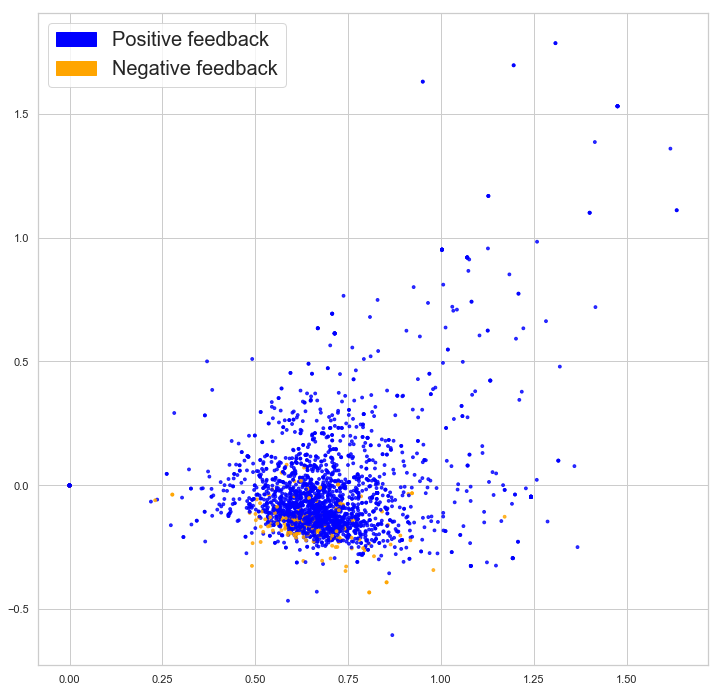

In [40]:
fig = plt.figure(figsize=(12, 12))          
plot_LSA(x_train_w2v, y_train_w2v)

# SMOTE (Synthetic Minority Oversampling Technique)
sm = SMOTE(random_state = 11, ratio = 1)
x_train_w2v_res, y_train_res = sm.fit_sample(x_train_w2v, y_train_w2v)

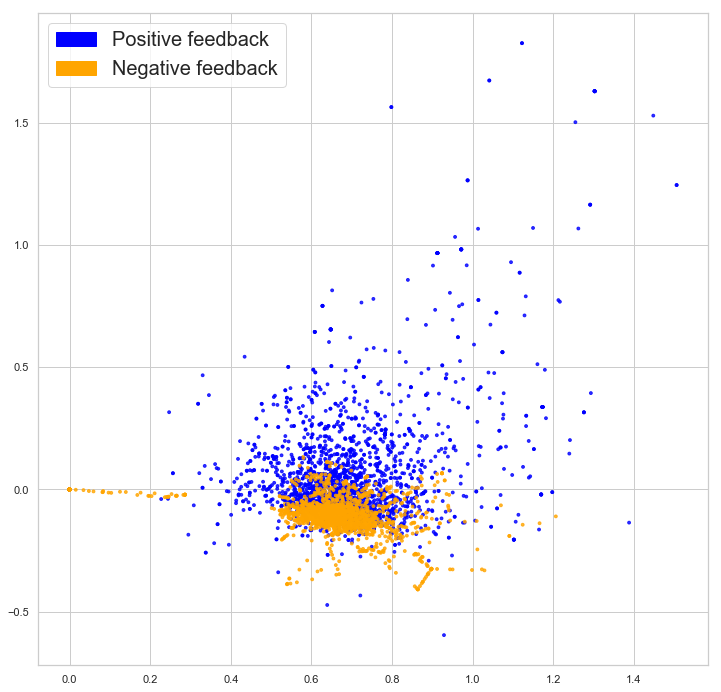

In [41]:
fig = plt.figure(figsize=(12, 12))          
plot_LSA(x_train_w2v_res, y_train_res)

accuracy = 0.862, precision = 0.339, recall = 0.816, f1 = 0.479
AUC = 0.93


[Text(0, 0.5, 'Positive'), Text(0, 1.5, 'Negative')]

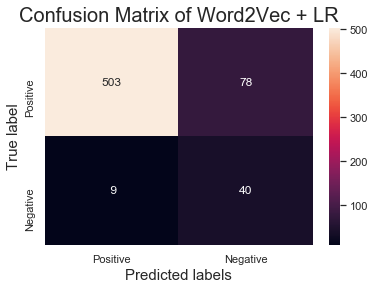

In [42]:
# Fitting a Classifier
clf_w2v = LogisticRegression(C = 6.0, class_weight = "balanced", solver = "liblinear",
                             n_jobs = -1, random_state = 111)
clf_w2v.fit(x_train_w2v_res, y_train_res)
y_predicted_w2v = clf_w2v.predict(x_test_w2v)

# Evaluation
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_w2v)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" %
      (accuracy, precision, recall, f1))

# AUC Score
y_pred_proba_w2v = clf_w2v.predict_proba(x_test_w2v)[::,1]
auc = roc_auc_score(y_test, y_pred_proba_w2v)
print("AUC = %.2f" % auc)

# Plot Confusion Matrix
cm_w2v = sns.heatmap(metrics.confusion_matrix(y_test_w2v, y_predicted_w2v),
                     annot = True, fmt = "2.0f")

cm_w2v.axes.set_title("Confusion Matrix of Word2Vec + LR", fontsize = 20)
cm_w2v.set_xlabel("Predicted labels", fontsize = 15)
cm_w2v.set_ylabel("True label", fontsize = 15)
cm_w2v.xaxis.set_ticklabels(["Positive", "Negative"])
cm_w2v.yaxis.set_ticklabels(["Positive", "Negative"])

<font color=yellow ><font>
## Part 6_Comparison

In [43]:
# Dataframe for comparison
com = {"Models":["BOW + Logistic Regression", "BOW + TF-IDF + Logistic Regression",
                 "BOW + SVM", "BOW + TF-IDF + SVM",
                 "BOW + XGBoost", "BOW + TF-IDF + XGBoost",
                 "Word2Vec + Logistic Regression"],
#       "Accuracy": [0.951, 0.914, 0.921, 0.935, 0.940, 0.932, 0.905],
#       "Precision": [0.667, 0.470, 0.493, 0.571, 0.867, 0.667, 0.440],
       "Recall": [0.755, 0.776, 0.694, 0.755, 0.306, 0.673, 0.816],
       "F1": [0.561, 0.608, 0.544, 0.556, 0.429, 0.440, 0.479],
       "AUC": [0.86, 0.93, 0.83, 0.91, 0.84, 0.90, 0.93]
      }
comparison = pd.DataFrame.from_dict(com)
comparison_sorted = comparison.sort_values(by=["Recall"], ascending = False)
comparison_sorted

,Models,Recall,F1,AUC
6,Word2Vec + Logistic Regression,0.816,0.479,0.93
1,BOW + TF-IDF + Logistic Regression,0.776,0.608,0.93
0,BOW + Logistic Regression,0.755,0.561,0.86
3,BOW + TF-IDF + SVM,0.755,0.556,0.91
2,BOW + SVM,0.694,0.544,0.83
5,BOW + TF-IDF + XGBoost,0.673,0.440,0.90
4,BOW + XGBoost,0.306,0.429,0.84


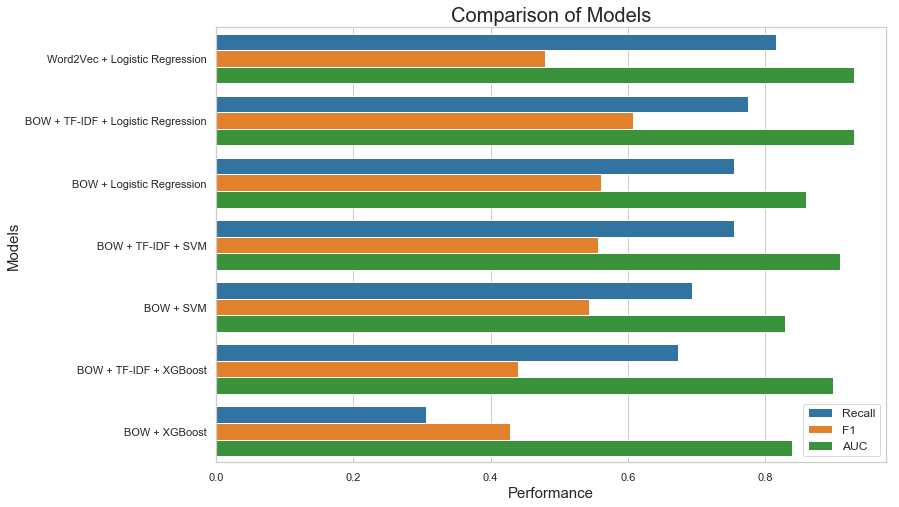

In [44]:
# Barplot for comparison
com_mt = pd.melt(comparison, id_vars = 'Models')

plt.figure(figsize = (12, 8))
com_plot = sns.barplot(x = "value", y = "Models", hue = "variable", data = com_mt,
                       order = comparison_sorted["Models"])
com_plot.set_title("Comparison of Models", fontsize = 20)
com_plot.set_xlabel("Performance", fontsize = 15)
com_plot.set_ylabel("Models", fontsize = 15)
plt.legend(loc = 4, fontsize = 12)

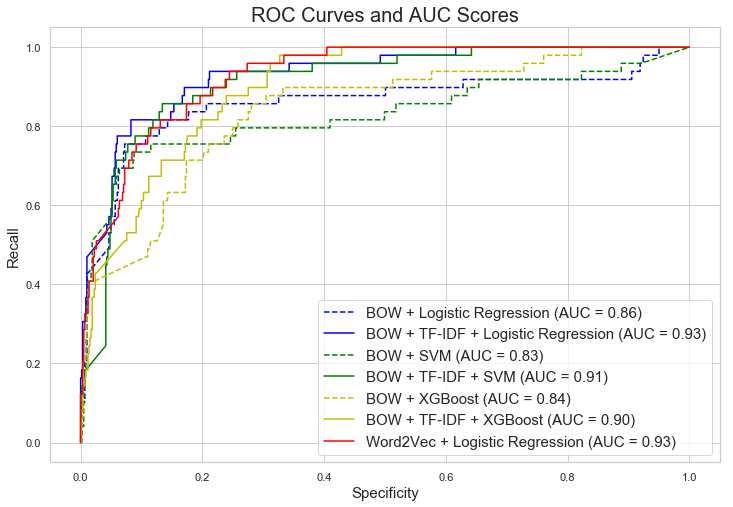

In [45]:
# ROC curve and AUC score for comparison

plt.figure(figsize = [12,8])
# BOW + Logistic Regression
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba_bow)
auc1 = metrics.roc_auc_score(y_test, y_pred_proba_bow)
plt.plot(fpr,tpr, '--b', label = "BOW + Logistic Regression (AUC = %.2f)" % auc1)
# BOW + TF-IDF + Logistic Regression
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba_tfidf)
auc2 = metrics.roc_auc_score(y_test, y_pred_proba_tfidf)
plt.plot(fpr,tpr, '-b' ,label = "BOW + TF-IDF + Logistic Regression (AUC = %.2f)" % auc2)
# BOW + SVM
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba_svm)
auc3 = metrics.roc_auc_score(y_test, y_pred_proba_svm)
plt.plot(fpr,tpr, '--g', label = "BOW + SVM (AUC = %.2f)" % auc3)
# BOW + TF-IDF + SVM
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba_tfidf_svm)
auc4 = metrics.roc_auc_score(y_test, y_pred_proba_tfidf_svm)
plt.plot(fpr,tpr, '-g', label = "BOW + TF-IDF + SVM (AUC = %.2f)" % auc4)
# BOW + XGBoost
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba_xgb)
auc5 = metrics.roc_auc_score(y_test, y_pred_proba_xgb)
plt.plot(fpr,tpr, '--y', label = "BOW + XGBoost (AUC = %.2f)" % auc5)
# BOW + TF-IDF + XGBoost
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba_tfidf_xgb)
auc6 = metrics.roc_auc_score(y_test, y_pred_proba_tfidf_xgb)
plt.plot(fpr,tpr, '-y', label = "BOW + TF-IDF + XGBoost (AUC = %.2f)" % auc6)
# Word2Vec + Logistic Regression
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba_w2v)
auc7 = metrics.roc_auc_score(y_test, y_pred_proba_w2v)
plt.plot(fpr,tpr, '-r', label = "Word2Vec + Logistic Regression (AUC = %.2f)" % auc7)

plt.title("ROC Curves and AUC Scores", fontsize = 20)
plt.xlabel("Specificity", fontsize = 15)
plt.ylabel("Recall", fontsize = 15)
plt.legend(loc = 4, fontsize = 15)

<font color=yellow ><font>
## Part 7_Error Analysis with LIME

In [46]:
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

In [47]:
c = make_pipeline(tfidf_vectorizer, clf_tfidf)
explainer = LimeTextExplainer(class_names=[0,1])

In [48]:
# Explaining individual predictions (Correctly predict: Positive)
idx = 424
exp = explainer.explain_instance(x_test[idx], c.predict_proba, num_features=10)
print('True class: %s' % y_test[idx])
exp.show_in_notebook(text=True)

True class: 0


In [49]:
# Explaining individual predictions (Correctly predict: Positive)
idx = 548
exp = explainer.explain_instance(x_test[idx], c.predict_proba, num_features=10)
print('True class: %s' % y_test[idx])
exp.show_in_notebook(text=True)

True class: 0


In [50]:
# Explaining individual predictions (Correctly predict: Negative)
idx =325
exp = explainer.explain_instance(x_test[idx], c.predict_proba, num_features=10)
print('True class: %s' % y_test[idx])
exp.show_in_notebook(text=True)

True class: 1


In [51]:
# Explaining individual predictions (Correctly predict: Negative)
idx =469
exp = explainer.explain_instance(x_test[idx], c.predict_proba, num_features=10)
print('True class: %s' % y_test[idx])
exp.show_in_notebook(text=True)

True class: 1


In [52]:
# Understanding why reviews are wrongly classified
idx = 549
exp = explainer.explain_instance(x_test[idx], c.predict_proba, num_features=10)
print('True class: %s' % y_test[idx])
exp.show_in_notebook(text=True)

True class: 1
